# BertViz Interactive Demo: Head View
## **Scroll down for pre-loaded visualizations** 👇👇👇👇👇👇



#Step 1: Installing BertViz and importing the modules

In [1]:
from IPython.display import Image     #This is used for rendering images in the notebook

In [ ]:
!pip install bertviz

     |████████████████████████████████| 156 kB 8.0 MB/s 
     |████████████████████████████████| 1.2 MB 12.8 MB/s 
     |████████████████████████████████| 2.6 MB 33.6 MB/s 
     |████████████████████████████████| 131 kB 42.5 MB/s 
     |████████████████████████████████| 3.3 MB 26.5 MB/s 
     |████████████████████████████████| 895 kB 33.7 MB/s 
     |████████████████████████████████| 636 kB 33.2 MB/s 
     |████████████████████████████████| 7.8 MB 50.1 MB/s 
     |████████████████████████████████| 79 kB 7.6 MB/s 
     |████████████████████████████████| 138 kB 57.4 MB/s 
     |████████████████████████████████| 127 kB 37.3 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
ERROR: pip's dependency resolver does not currently take 

In [ ]:
from bertviz import head_view,model_view
from transformers import BertTokenizer, BertModel

#Step 2: Load the models and retrieve attention

In [ ]:
# Load model and retrieve attention
model_version = 'bert-base-uncased'
do_lower_case = True
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
sentence_a = "A lot of people like animals so they adopt cats"
sentence_b = "A lot of people like animals so they adopt dogs"
inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors='pt', add_special_tokens=True)
token_type_ids = inputs['token_type_ids']
input_ids = inputs['input_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


#Step 3: Head view
The attention-head view visualizes attention in one or more heads in a particular layer in the model.

## Usage
* **Hover** over any **token** on the left/right side of the visualization to filter attention from/to that token. The colors correspond to different attention heads.
* **Double-click** on any of the **colored tiles** at the top to filter to the corresponding attention head.
* **Single-click** on any of the **colored tiles** to toggle selection of the corresponding attention head. 
* **Click** on the **Layer** drop-down to change the model layer (zero-indexed).
* The lines show the attention from each token (left) to every other token (right). Darker lines indicate higher attention weights. When multiple heads are selected, the attention weights are overlaid on one another. 

In [ ]:
head_view(attention, tokens)

<IPython.core.display.Javascript object>

#Step 4: Processing and displaying attention heads
# Model View
The model view gives a birds-eye view of attention across all of the layers (rows) and heads (columns) in the model. In this case we are showing *bert-base*, which has 12 layers and 12 heads (zero-indexed). 

## Usage
* **Click** on any **cell** for a detailed view of attention for the associated attention head.
* Then **hover** over any **token** on the left side of detail view to filter the attention from that token.
* The lines show the attention from each token (left) to every other token (right). Darker lines indicate higher attention weights.  

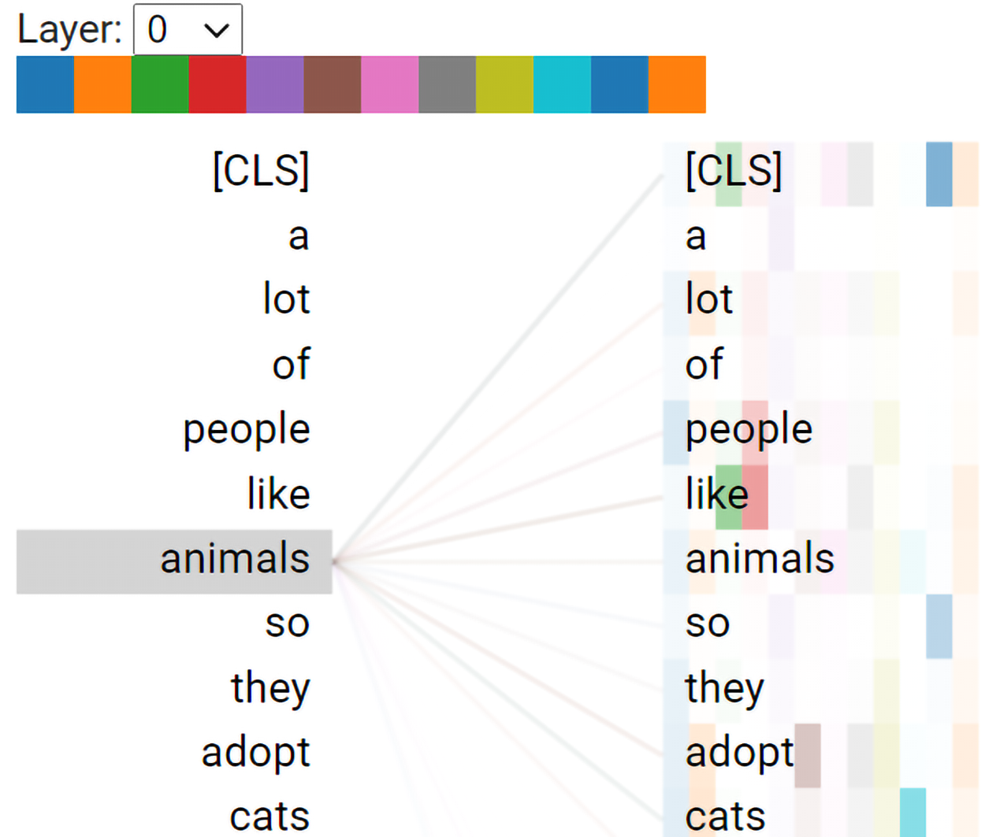

In [3]:
Image('../Notebook images/14/B17948_14_02.png', width=400) #This is used for rendering images in the notebook

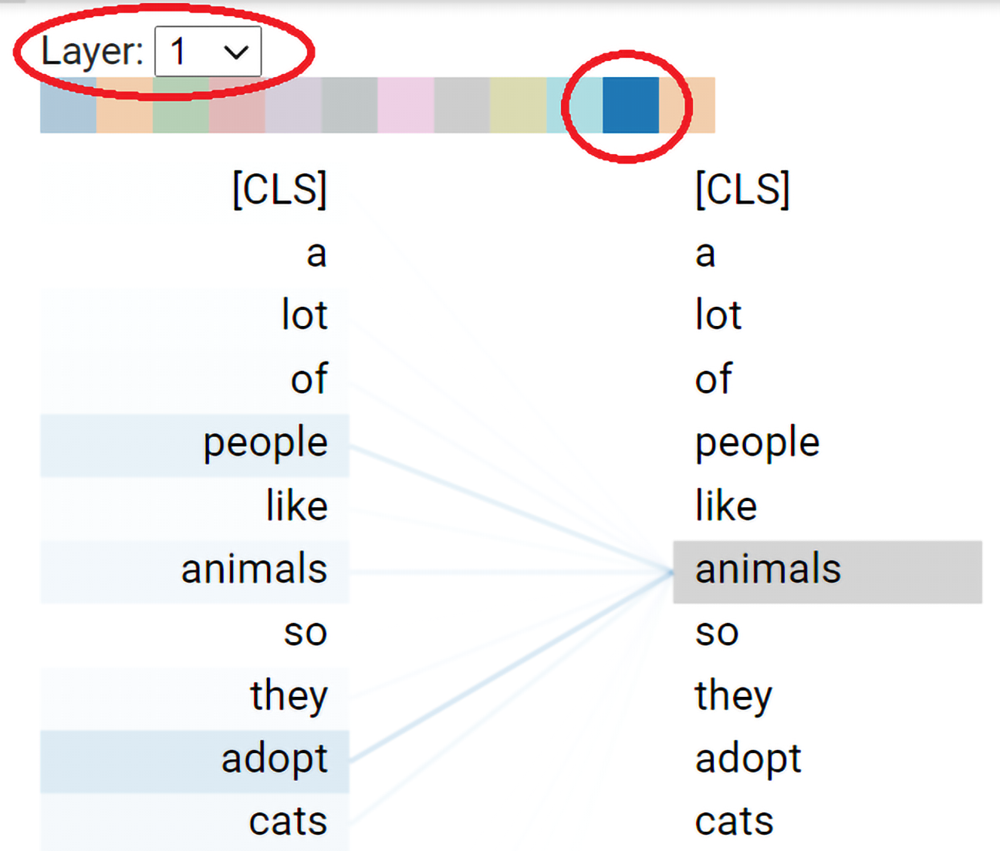

In [4]:
Image('../Notebook images/14/B17948_14_03.png', width=400) #This is used for rendering images in the notebook

#Step 5: Model view

In [ ]:
model_view(attention, tokens, sentence_b_start)

<IPython.core.display.Javascript object>